# End-to-End Multi-class Dog breed classification

Builds end-to-end multi-class classification image classifier using Tensorflow 2.0 and Tensorflow Hub.

Steps to build the classifier:

## 1.0 Problem

Identifying the breed of a dog given an image of a dog.

## 2.0 Data

Data from kaggle's dog breed: https://www.kaggle.com/competitions/dog-breed-identification/data

## 3.0 Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4.0 Features

Some info about the data:

- unstructured data
- best to use deep learning/transfer learning
- 120 breeds of dogs
- 10.2K files in training set
- 10.4k file in test set

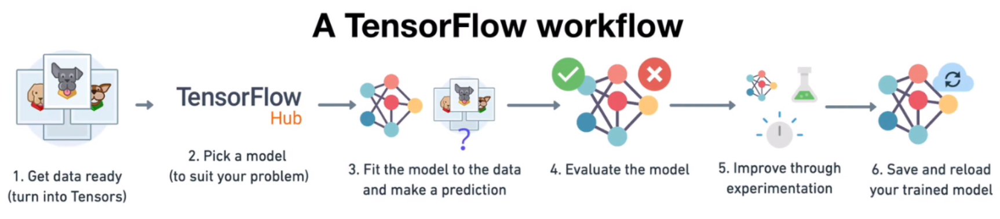

In [1]:
# Unzip the data
#!unzip -o "/content/drive/MyDrive/ML/dog-breed-identification.zip" -d "/content/drive/MyDrive/ML/dog-vision/"
#!unzip "/content/drive/MyDrive/ML/dog-breed-identification.zip" "train/*.jpg" -d "/content/drive/MyDrive/ML/dog-vision/"

In [2]:
# import TensorFlow
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print(f"TF Hub version: {hub.__version__}")

# Check for GPU availability - this depends on the Runtime
print("GPU available" if tf.config.list_physical_devices("GPU") else "Not available")

TF version 2.14.0
TF Hub version: 0.15.0
GPU available


## Get data ready (turn into Tensors)

Tensors = numerical representation of our data.

In [3]:
import pandas as pd

labels_csv = pd.read_csv("/content/drive/MyDrive/ML/dog-vision/labels.csv")
print(labels_csv.describe())
# print("---")
# labels_csv.dtypes
# print("---")
# labels_csv.columns

# id = image name
# breed = breed of the dog

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [4]:
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


<Axes: >

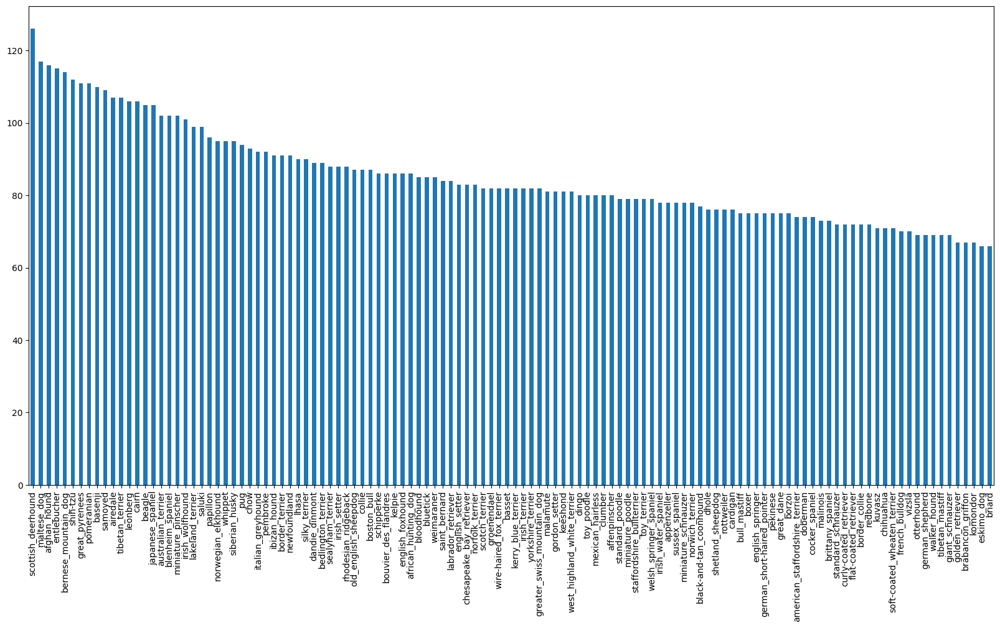

In [5]:
# How many images there are for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [6]:
# Average amount of dogs per class/breed
labels_csv["breed"].value_counts().median()

82.0

In [7]:
# How to get the images into the colab notebook
file_ids = labels_csv["id"]
filenames = ["/content/drive/MyDrive/ML/dog-vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]
# len(filenames)

['/content/drive/MyDrive/ML/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/ML/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check wether the amount of filenames matches numner of actual image files.
# I thought this was not very useful, however, I noticed that when extracting the files on colab
# I was missing over 2K images

import os

nof_images_actual = len(os.listdir("/content/drive/MyDrive/ML/dog-vision/train"))
if nof_images_actual != len(filenames):
  print("Houston we've got a problem")
  print("Nof actual images:", nof_images_actual)
else:
 print("All OK\nNof actual images:", nof_images_actual)

All OK
Nof actual images: 10222


In [9]:
# Prepabe labesl to be used by a machine
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
len(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [10]:
# Check number of labels == number of filenames
len(labels) == len(filenames)

True

In [11]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [12]:
# Turn/Represent a single label into an array of booleans
# Essentially: identify which breed is in label[0] in terms of one-hot-encoding
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [13]:
# Let's scale the above and turn every label/dog into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
# boolean_labels[:2]
# type(boolean_labels[0])
# len(boolean_labels[0]) == 120
# So we have a list of 10220 numpy.ndarrays

In [14]:
# Example turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # Index at which that label/breed occurs
print(boolean_labels[0].argmax()) # Index at which label occurs in boolean array
print(boolean_labels[0].astype(int)) # Convert to bool to int

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [15]:
# So, if I want to scale the whole boolean_labels list into one-hot-encoding
int_labels = [l.astype(int) for l in boolean_labels]
# int_labels
# int_labels[0].argmax()

### Creating our own validatoin set

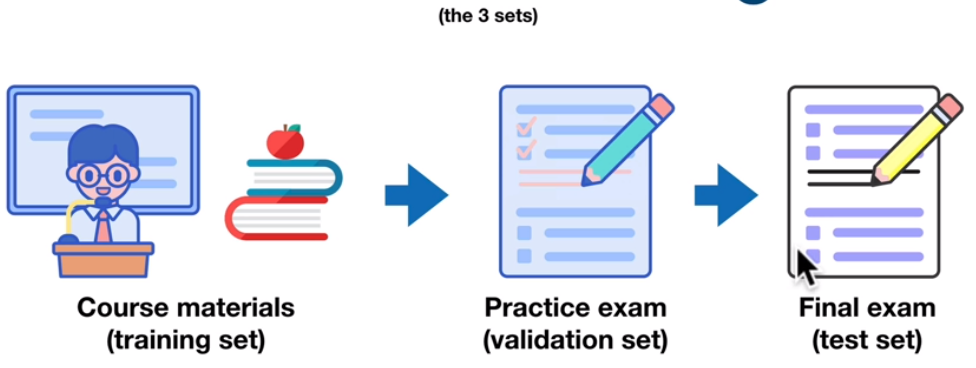

The `Validation set` is a subset we want to validate that our ML model is working.


In [16]:
# Set X & y variables
X = filenames
y = boolean_labels

We're going to reduce the amount of training images to save some time. This is also applicable to a real world scenario. Because we want to reduce the amount of time it takes us to train a model.

In [17]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:500}

In [18]:
# Split data into train and validation sets
from sklearn.model_selection import train_test_split

# np.random.seed(42)

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [19]:
# Sanity check
# X = dog images
# y = corresponding dog breed on the image
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/ML/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/ML/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/ML/dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/ML/dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/ML/dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False

## Turn images into Tensors.

What are tensors??? - Images in numerical form.

In [20]:
# COnvert an image to numpy array

from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape # The image is an RBG array

(257, 350, 3)

In [21]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [22]:
# You can turn almost anything into a tensor with the following function.

tf.constant(image)[:2]
# Since this is a tensor, it can now run on a GPU instead of a CPU.

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [23]:
# Define image size (resolution)
IMG_SIZE = 224

# Function to turning images into tensors
def process_image(img_path):
  """
  INPUT: image path
  OUTPUT: tensor of the image
  """
  image = tf.io.read_file(img_path)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values - normalization (https://www.tensorflow.org/tutorials/load_data/images#standardize_the_data)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the resolution (224x244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

It's a good idea to process our images in batches - https://arxiv.org/abs/1804.07612

Calculating patterns in all 10000 images won't all fit in the memory.

In order to use TF effectively, we need our data in the form of a tupple `(image, label)`.

In [24]:
# Create function to return a tupple of (image, label)

def get_image_label(image_path, label):
  """
  Takes the image path and label and returns a tupple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [25]:
# Demo of the above
#type(get_image_label(X[42], tf.constant(y[42]))) # tupple
get_image_label(X[42], tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Write a function to turn all the data (`X` & `y`) into batches.

In [26]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data bud doesn't shuffle it's validation data.
  Also accepts as input (no labels).
  """

  # Test data batch
  if test_data:
    print("Create test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # Turn a tensor into a TF DataFrame
    data_batch = data.map(process_image).batch(BATCH_SIZE) # https://www.tensorflow.org/api_docs/python/tf/data/Dataset#batch

  # Validation data batch
  elif valid_data:
    print("Create validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

  # Training data batch
  else:
    print("creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices(((tf.constant(X)),
                                              tf.constant(y)))
    # Shuffling pathnames and labesl befoer mapping image processor function is faster
    data = data.shuffle(buffer_size=len(X)) # len(data) == len(X)

    # Create (image, label) typples (also turn the image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [27]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data batches...
Create validation data batches...


In [28]:
train_data.element_spec
# shape(None, Height, Width, Colors(RGB))

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [29]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

## Visualizing Data Batches

In [30]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup teh figure
  plt.figure(figsize=(10,10))
  # Loop through the 25
  for i in range(25):
    # Creat subplots
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn off the grid display
    plt.axis("off")

In [31]:
train_data # Tupple of batches

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [32]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.25490198, 0.09803922, 0.        ],
          [0.25710785, 0.09803922, 0.00110294],
          [0.2664216 , 0.1017157 , 0.00759804],
          ...,
          [0.09387255, 0.16053922, 0.12132354],
          [0.12120099, 0.18786766, 0.14865197],
          [0.13333334, 0.20000002, 0.16078432]],
 
         [[0.25850186, 0.10163911, 0.00359988],
          [0.26369047, 0.10462186, 0.00768557],
          [0.27146143, 0.10675552, 0.01263787],
          ...,
          [0.14272803, 0.20939471, 0.17017902],
          [0.17283352, 0.23950018, 0.2002845 ],
          [0.17941178, 0.24607845, 0.20686276]],
 
         [[0.2649335 , 0.10807074, 0.01003151],
          [0.2706933 , 0.11162466, 0.01388087],
          [0.2781688 , 0.1134629 , 0.01647409],
          ...,
          [0.20457153, 0.2712382 , 0.23202251],
          [0.20515145, 0.27181813, 0.23260243],
          [0.20259106, 0.26925772, 0.23004204]],
 
         ...,
 
         [[0.58298534, 0.48886776, 0.31631872],
          [0.60774

In [33]:
len(train_images), len(train_labels) # batch sizes

(32, 32)

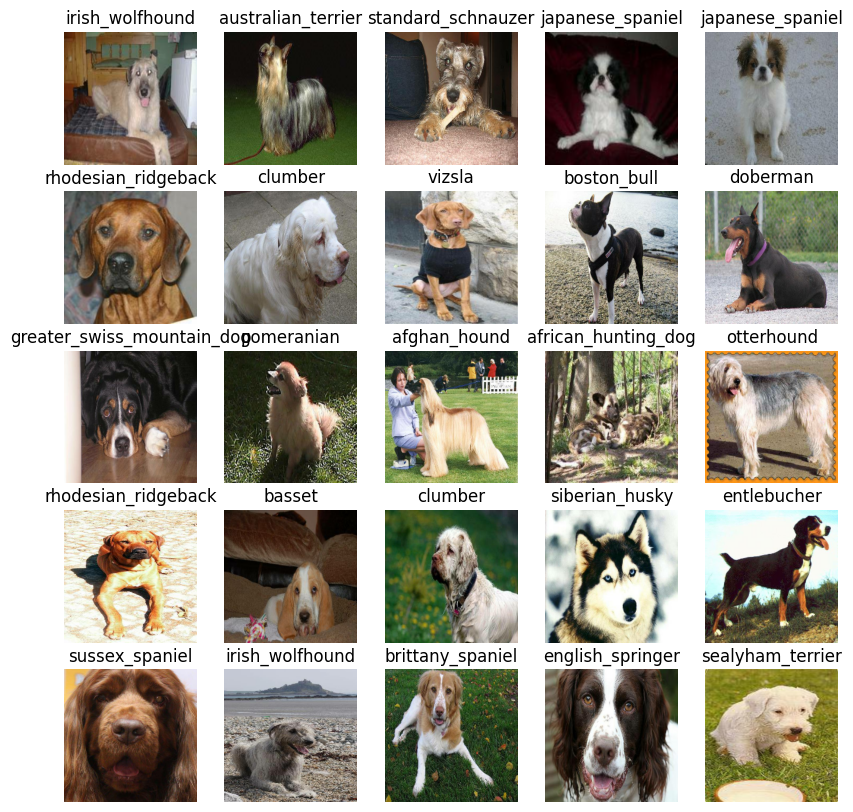

In [34]:
show_25_images(train_images, train_labels)

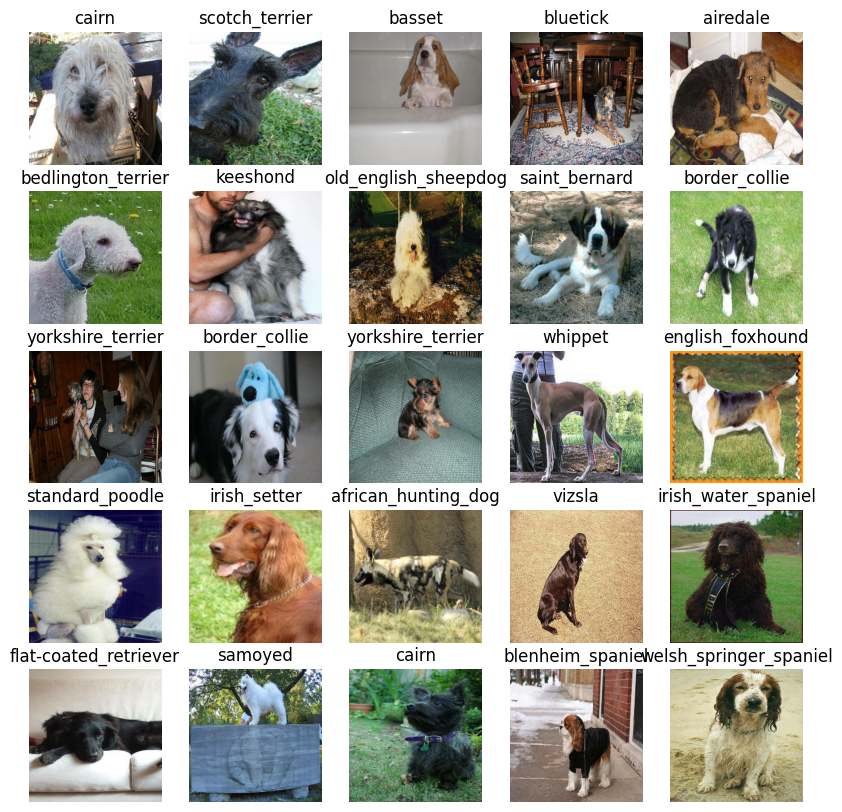

In [35]:
val_images, val_labels = next(val_data.as_numpy_iterator())
#val_images, val_labels

show_25_images(val_images, val_labels)

## Building a model

Before building a model, we need to define:
- the input shape (out images shape, in the form of Tensors) to out model
- the output shape (image labels, in the form of Tensors) of our model
- the URL of the model we want to use


In [36]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# We're going to grab out model from Tensorflow hub - transfer learning.
# There are many hubs where you can grab pretrained models from like papers with code, pytorch hub, etc..
# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [37]:
# Create function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"Building model with: {MODEL_URL}")

  # Setup model layers
  model = tf.keras.Sequential([ # Sequential: This function defines the layers of a model.
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer): the highest value in the output array indicates the label/breed.
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [38]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


**Total params**: 5552953 (21.18 MB) - Trainable + non-trainable params<br>
**Trainable params**: 120240 (469.69 KB) - the parameters which we can train the model to identify our images<br>
**Non-trainable params**: 5432713 (20.72 MB) - the parameters which were pre-trained for us to identify patterns.

Why the models has 2 layers: https://towardsdatascience.com/review-mobilenetv2-light-weight-model-image-classification-8febb490e61c
What is convolutional Neural Network: https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

What does our function do?

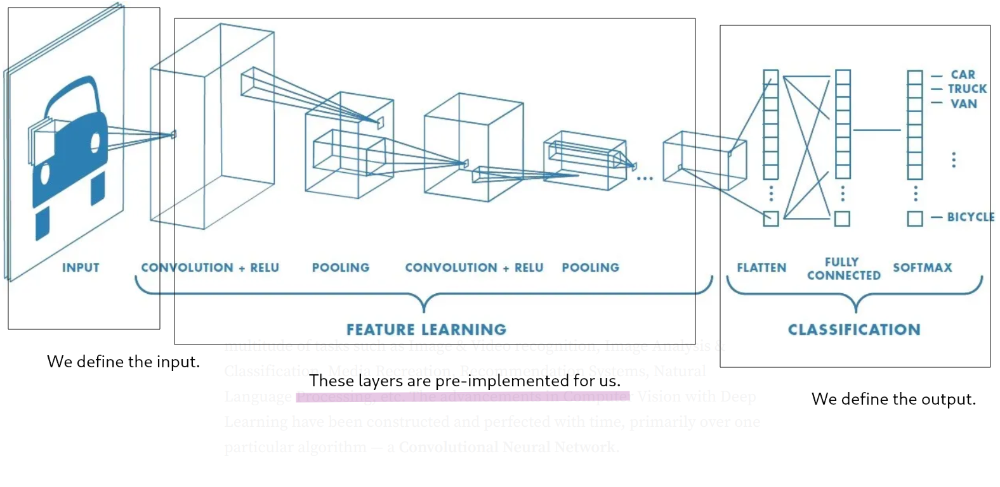

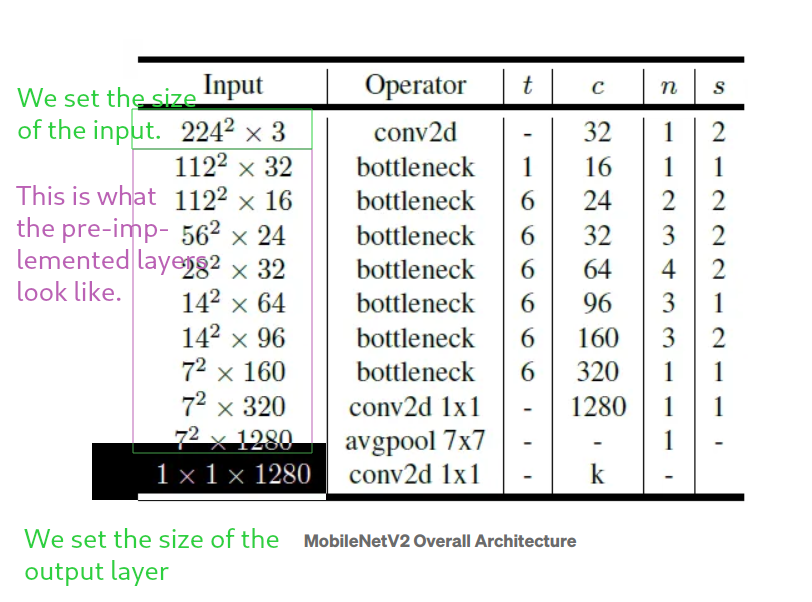

Each convolution in the model looks into identifying patters in each image and. These patters should indicate the label/breed.

The patterns are being figured out by the model.

Which activation function and which loss metric should we use? There are a lot of activation functions and loss metrics.

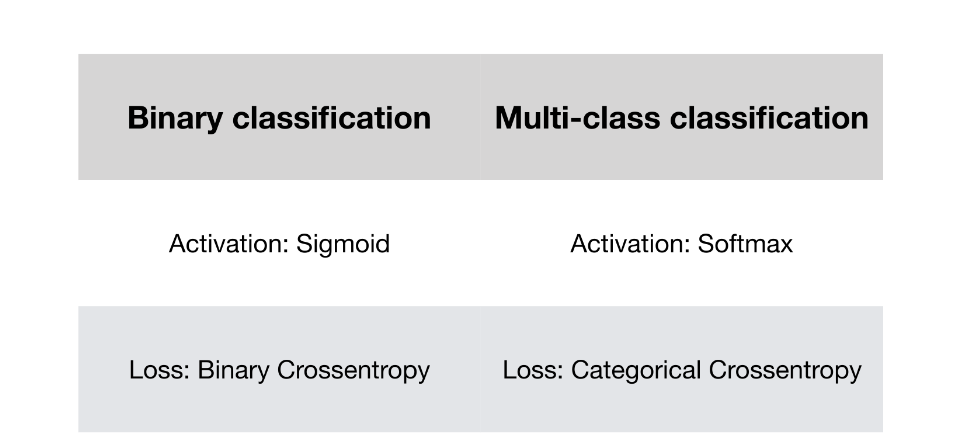

## Creating callbacks

Helper functions a model use during training to track and save its progress - stop its training if it's overfitting.

With models which take a lot of time to train, you want to know how your models is doing with its training. This is where `callbacks` come into play.

### TensorBoard callback

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

Here we create 2 callbacks:
  1. tracks out model's progress
  2. early stopping to prevent overfitting

In [39]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [40]:
import datetime

# 1. tracks out model's progress - https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/ML/dog-vision/logs",
                   datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

tensorboard_callback = create_tensorboard_callback()

In [41]:
# 2. early stopping to prevent overfitting - https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Training a model (on a subset of data)

- Train the models on 1000 images

In [42]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [43]:
# Check to make sure we're using a GPU.
print("Running on GPU!" if tf.config.list_physical_devices("GPU") else "GPU not available")

# Even though a GPU might not be available, the model can still get trained on a CPU.
# However, that will be slower.

Running on GPU!


from keras.api._v2.keras import callbacks
Let's creata function to train the model.

- creates model: `create_model()`
- Setup a TensorBoard callback: `create_tensorboard_callback()`
- Fit data to model: `fit()` using training data, validation data, nof epochs and the callbacks
- Return model

In [44]:
# Build the function to train the model

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [45]:
%%time
model = train_model()
# 800 images in the training set 800/32=25 steps for the training
# 200 images in the validation set 200/32=7 steps for the validation

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 171s 5s/step - loss: 4.6606 - accuracy: 0.0925 - val_loss: 3.2912 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 3s 133ms/step - loss: 1.6549 - accuracy: 0.6837 - val_loss: 2.0417 - val_accuracy: 0.5450
Epoch 3/100
25/25 [==============================] - 3s 131ms/step - loss: 0.5699 - accuracy: 0.9312 - val_loss: 1.6106 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 3s 103ms/step - loss: 0.2496 - accuracy: 0.9862 - val_loss: 1.4385 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 3s 102ms/step - loss: 0.1458 - accuracy: 0.9975 - val_loss: 1.3755 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 110ms/step - loss: 0.0999 - accuracy: 1.0000 - val_loss: 1.3361 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================]

Question: It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note: Overfitting to begin with is a good thing! It means our model is learning! - So it's actually working.**

### Check the TensorBoard logs

Use magic function

In [46]:
%tensorboard --logdir /content/drive/My\ Drive/ML/dog-vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating prediction with the trained model

In [47]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [48]:
# Make prediction using validation data set - the model hasn't seen this set
val_predictions = model.predict(val_data, verbose=1)
val_predictions # The values in the arrays are closely related to the SoftMax algorithm we used.

7/7 [==============================] - 1s 75ms/step


array([[2.7035290e-04, 2.8878016e-05, 1.6188065e-03, ..., 1.4500899e-04,
        2.0185285e-05, 9.7109005e-03],
       [3.5150377e-03, 2.1799392e-04, 3.5485830e-02, ..., 2.5557801e-03,
        5.1769828e-03, 4.2998825e-05],
       [2.8670375e-04, 6.9859620e-05, 1.6074718e-03, ..., 1.3673330e-05,
        4.2435899e-05, 1.1380933e-03],
       ...,
       [7.3768265e-06, 2.1612756e-04, 7.6725631e-04, ..., 8.8249153e-06,
        2.8883526e-04, 3.7394690e-05],
       [8.2734395e-03, 6.7599292e-04, 3.4700119e-04, ..., 7.3586401e-05,
        6.3614942e-05, 5.1773340e-03],
       [1.0932167e-03, 1.9578027e-05, 6.8370014e-04, ..., 1.8181008e-03,
        6.1713514e-04, 5.9669732e-05]], dtype=float32)

In [49]:
val_predictions.shape # teh validation set is 200 images

(200, 120)

The output is a probability value for each label for each image in the validation set. The highest value in an array corresponds to what the models thinks is the correct answer aka breed of the dog.

In [50]:
# The total percentage of all probabilities in a single prediction should be 100%
# So...
np.sum(val_predictions[0])

1.0

In [51]:
index = 2
max_index = val_predictions[index].argmax() # Return the index of the maximum prediction of the first image
max_pred_value = val_predictions[index].max() #Return the value of the maximum prediction of the first image
pred_breed = unique_breeds[max_index]

print(f"Max prediction value @index: {max_pred_value}")
print(f"Max prediction index: {max_index}")
print(f"Predicted breed @index: {pred_breed}")

Max prediction value @index: 0.918114185333252
Max prediction index: 8
Predicted breed @index: basset


In [86]:
# Let's turn the prediction probabilities into labels to compare the results

def get_pred_label(prediction_probabilities):
  """
  TUrns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

We need to unbatch the validation data.
Compare the validattion data to the true labels.
https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch

In [53]:
val_images_unbatched = []
val_labels_unbatched = []

for image, label in val_data.unbatch().as_numpy_iterator():
  val_images_unbatched.append(image)
  val_labels_unbatched.append(label)

In [54]:
# demonstration - bad prediction (low probability)
get_pred_label(val_labels_unbatched[0])

'cairn'

In [55]:
get_pred_label(val_predictions[0])

'irish_wolfhound'

In [56]:
# demonstration - good prediction (high probability)
get_pred_label(val_labels_unbatched[2])

'basset'

In [57]:
get_pred_label(val_predictions[2])

'basset'

In [58]:
# Create function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) - Tensors - Returns separate arrays of images and labels
  """

  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [59]:
val_images, val_labels = unbatchify(val_data)

Visualise the results.

In [125]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for the sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get label of prediction
  pred_label = get_pred_label(pred_prob)

  # Plot results
  plt.imshow(image)
  plt.xticks()
  plt.yticks()

  # Add colours based on prediction
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Style the plot
  plt.title("Predicted label: {}\nCertainty probability: {:2.0f}%\nTrue label: {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color, fontdict={"horizontalalignment":"center"})
  plt.axis('off')

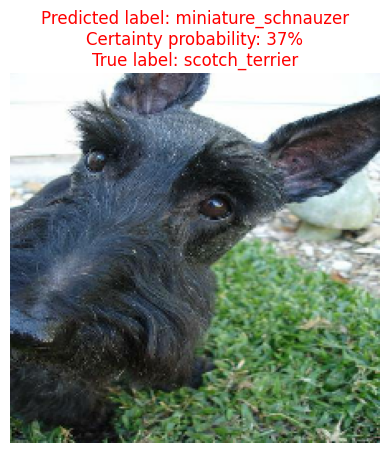

In [126]:
plot_pred(prediction_probabilities=val_predictions,
          labels=val_labels,
          images=val_images,
          n=1)

Let's find the top 10 prediction probabilities and plot them.

In [71]:
# Top 10 prediction indexes
val_predictions[0], val_predictions[0].argmax(), val_predictions[0].max()

(array([2.70352903e-04, 2.88780157e-05, 1.61880651e-03, 6.23158048e-05,
        6.15477969e-04, 1.02495556e-04, 1.00348620e-02, 9.66655207e-04,
        4.01222242e-05, 4.33139474e-04, 2.81948538e-04, 4.65566191e-05,
        2.95740057e-04, 2.64241098e-04, 1.76649366e-03, 1.69887702e-04,
        1.44924861e-05, 9.57468376e-02, 1.72537038e-05, 1.53659930e-04,
        1.02955310e-04, 7.70539555e-05, 1.79646740e-05, 2.96896702e-04,
        1.71169930e-04, 8.58866406e-05, 2.17874333e-01, 1.87785365e-04,
        4.70399216e-04, 5.03665535e-04, 4.51086926e-05, 3.15797515e-04,
        6.53031049e-04, 5.98669749e-06, 6.41786610e-04, 4.33085896e-02,
        1.04032461e-05, 1.30993780e-04, 9.48609886e-05, 3.70780908e-04,
        5.18377579e-04, 2.65926392e-05, 5.72191639e-05, 9.49630485e-05,
        3.17219201e-05, 8.11802383e-05, 1.07321648e-04, 1.11649031e-04,
        7.61612537e-05, 1.66316331e-05, 3.78424680e-04, 3.57969002e-05,
        3.03105044e-04, 2.52831796e-05, 1.70137631e-04, 2.259149

In [80]:
# Top 10 predictions for validation images at index 0 sorted in ascending order
val_predictions[0].argsort()[-10:][::-1], val_predictions[0][val_predictions[0].argsort()[-10:]][::-1]

(array([ 59,  26,  17,  70,  65,  35, 100,  73, 103, 109]),
 array([0.27492782, 0.21787433, 0.09574684, 0.07791434, 0.04732678,
        0.04330859, 0.03819568, 0.03048079, 0.02578491, 0.02133315],
       dtype=float32))

In [82]:
# Top 10 predicted breeds for validation image at index 0 in ascending order
unique_breeds[val_predictions[0].argsort()[-10:][::-1]]

array(['irish_wolfhound', 'cairn', 'border_terrier', 'lhasa', 'komondor',
       'dandie_dinmont', 'shih-tzu', 'maltese_dog',
       'soft-coated_wheaten_terrier', 'tibetan_terrier'], dtype=object)

In [67]:
np.array([3, 1, 2]).argsort()

array([1, 2, 0])

In [69]:
np.array([3, 1, 2]).argsort()[-2:]

array([2, 0])

In [110]:
# Let's plot the top 10 predictions for an arbitrary index
def plot_top_10_preds(prediction_probabilities, labels, n=1):


  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find top 10 prediction values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Plot the results
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="black")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  top_plot[0].set_color("red")
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

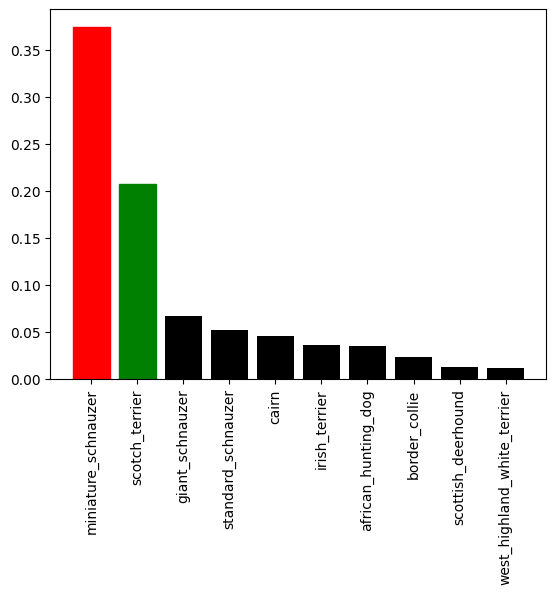

In [112]:
plot_top_10_preds(prediction_probabilities=val_predictions,
                  labels=val_labels,
                  n=1)

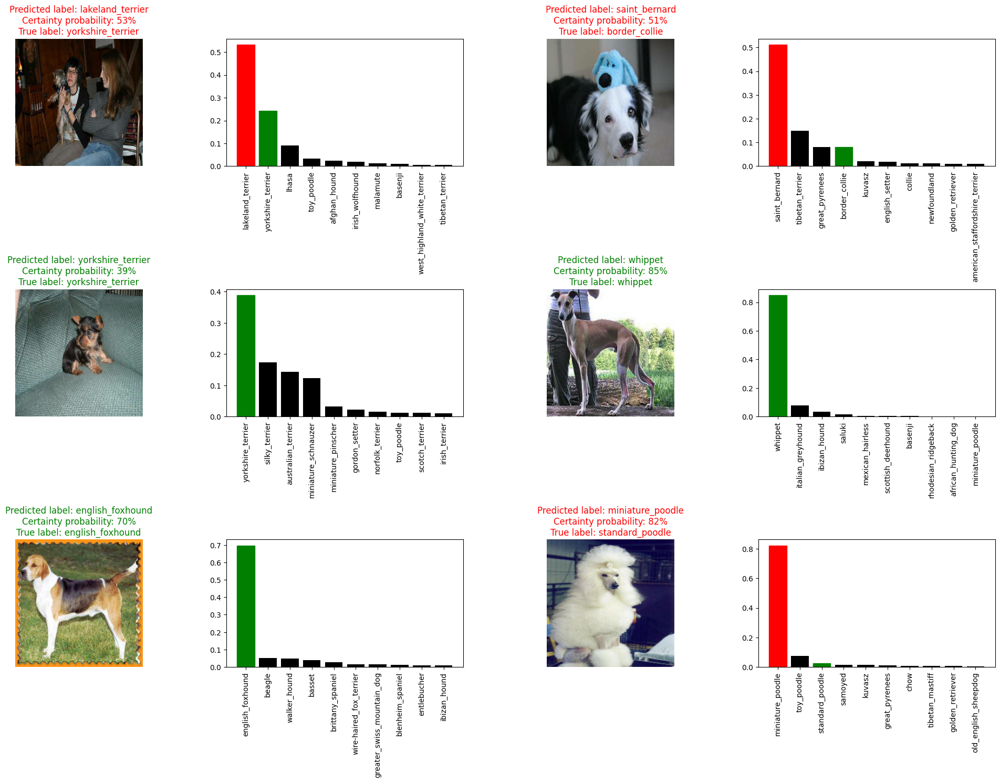

In [128]:
# Let's compare predictions with true labels side-by-side
i_multiplier = 10
nof_rows = 3
nof_cols = 2
nof_images = nof_rows * nof_cols
plt.figure(figsize=(10*nof_cols, 5*nof_rows))
for i in range(nof_images):
  plt.subplot(nof_rows, 2*nof_cols, 2*i+1)
  plot_pred(prediction_probabilities=val_predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(nof_rows, 2*nof_cols, 2*i+2)
  plot_top_10_preds(prediction_probabilities=val_predictions,
            labels=val_labels,
            n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()